In [11]:
from cryoS2Sdrop.analyze import *
from cryoS2Sdrop.deconvolution import tom_deconv_tomo
from skimage import exposure

deconv_kwargs = {
    "angpix": 14.08,
    "defocus": -0.25,
    "snrfalloff": 0.6,
    "deconvstrength": 0.45,
    "highpassnyquist": 0.02,
}

PARENT_PATH = setup.PARENT_PATH

pd.options.display.float_format = "{:,.3f}".format
pd.set_option('display.max_columns', 50)

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Tomophantom all versions image

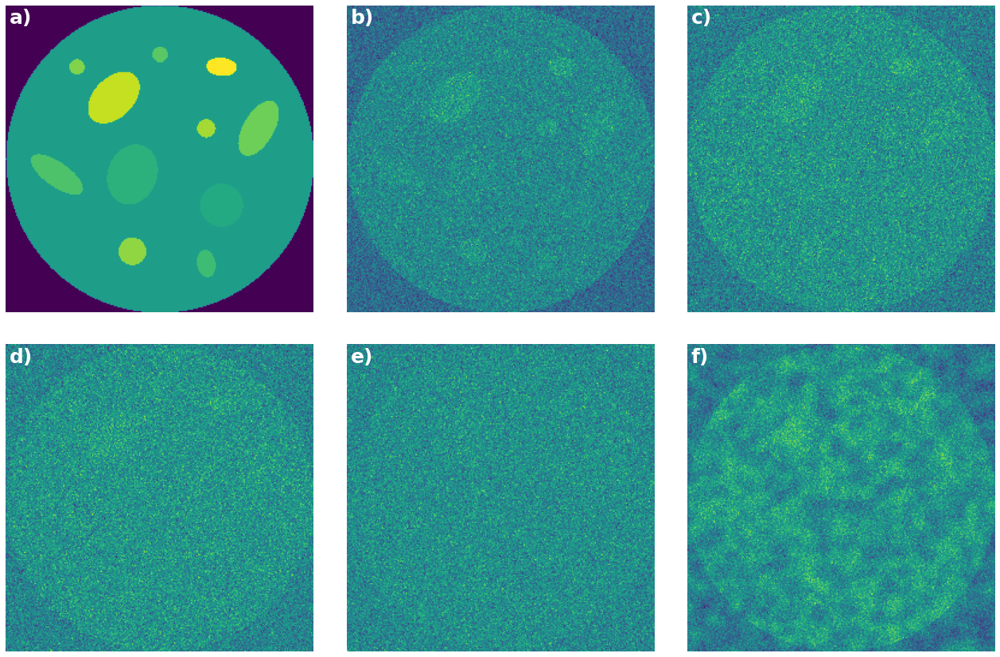

In [7]:
tomogram_list = [
    "tomoPhantom_model14",
    "tomoPhantom_model14_noisyGaussPoissVL",
    "tomoPhantom_model14_noisyGaussPoissL",
    "tomoPhantom_model14_noisyGaussPoissM",
    "tomoPhantom_model14_noisyGaussPoissH",
    "tomoPhantom_model14_noisyGaussPoissVL_Perlin",
    # "tomoPhantom_model14_noisyGaussPoissL_Perlin",
    # "tomoPhantom_model14_noisyGaussPoissM_Perlin",
    # "tomoPhantom_model14_noisyGaussPoissH_Perlin"
]

fig, ax = plt.subplots(2, 3, figsize=(18, 12))
ax = ax.ravel()
plt.tight_layout()
n = 0
for tomo, my_ax in zip(tomogram_list, ax):
    data = read_array(os.path.join(PARENT_PATH, "data/S2SDenoising/dummy_tomograms/%s.mrc" %tomo))
    data = data[len(data)//2]
    my_ax.set_axis_off()
    my_ax.imshow(data)
    my_ax.text(0.0125, 0.94, string.ascii_lowercase[n]+')', transform=my_ax.transAxes, size=25, weight='bold', color='white')
    n+=1
    
plt.show()

# Tomophantom all models

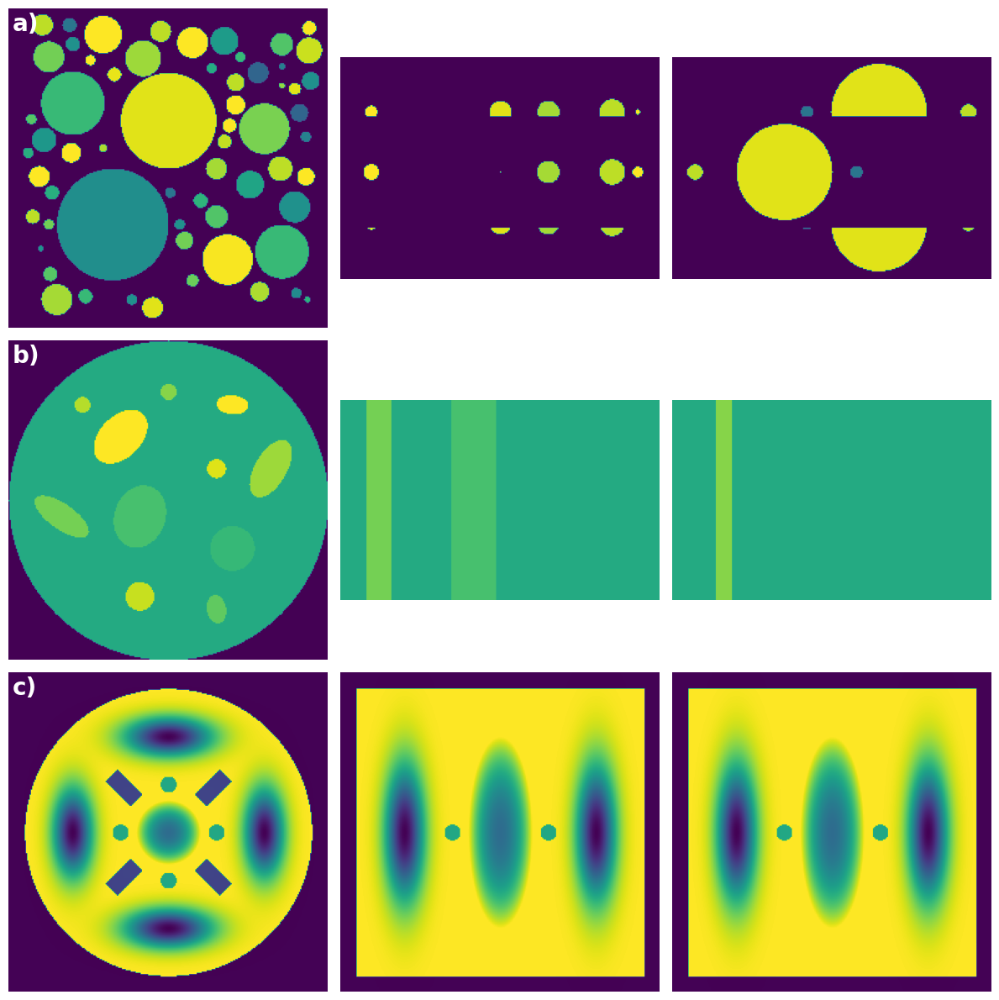

In [35]:
tomogram_list = [
    "tomoPhantom_model8",
    "tomoPhantom_model14",
    "tomoPhantom_model16"
]

fig, ax = plt.subplots(3, 3, figsize=(12, 12), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))

plt.tight_layout()
for i, tomo in enumerate(tomogram_list):
    
    data = read_array(os.path.join(PARENT_PATH, "data/S2SDenoising/dummy_tomograms/%s.mrc" %tomo))
    data = standardize(clip(data))
    data = scale(data)
    zidx, yidx, xidx = np.array(data.shape)//2
    
    my_ax = ax[i]
    
    my_ax[0].imshow(data[zidx], vmin=0, vmax=1)
    my_ax[1].imshow(data[:, yidx, :], vmin=0, vmax=1)
    my_ax[2].imshow(data[:, :, xidx], vmin=0, vmax=1)
    
    my_ax[0].text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=my_ax[0].transAxes, size=20, weight='bold', color='white')

    
plt.show()

# Metrics tables

## RealBernoulli experiments

In [ ]:
tomo_list = [
    'tomoPhantom_model8_noisyGaussPoissVL',
    'tomoPhantom_model8_noisyGaussPoissL',
    'tomoPhantom_model8_noisyGaussPoissM',
    'tomoPhantom_model8_noisyGaussPoissH',
    'tomoPhantom_model14_noisyGaussPoissVL',
    'tomoPhantom_model14_noisyGaussPoissL',
    'tomoPhantom_model14_noisyGaussPoissM',
    'tomoPhantom_model14_noisyGaussPoissH',
    'tomoPhantom_model16_noisyGaussPoissVL',
    'tomoPhantom_model16_noisyGaussPoissL',
    'tomoPhantom_model16_noisyGaussPoissM',
    'tomoPhantom_model16_noisyGaussPoissH'
            ]

data_log = []

for tomo in tqdm(tomo_list):
    logdir = 'data/S2SDenoising/model_logs/%s/realBernoulli_dropoutLevel_comparison/' %tomo
    logdir = os.path.join(PARENT_PATH, logdir)

    _data_log = logdir_to_dataframe(logdir, clip_values=True)
    data_log.append(_data_log)

data_log = pd.concat(data_log)
data_log = data_log.reset_index().drop('index', 1)
data_log.head()

In [90]:
df = data_log.groupby(['tomo_name', 'noise_level', 'p'])['full_tomo_ssim', 'full_tomo_psnr'].mean().reset_index()

df2 = data_log.groupby(['tomo_name', 'noise_level'])['n2v_ssim', 'n2v_psnr'].mean().reset_index()
df2['p'] = 'N2V Ref'
df2 = df2[['tomo_name', 'noise_level', 'p', 'n2v_ssim', 'n2v_psnr']]
df2.columns = ['tomo_name', 'noise_level', 'p', 'full_tomo_ssim', 'full_tomo_psnr']

df = pd.concat([df, df2])

cell
blobs
spaceship


Text(775.3131313131312, 0.5, '')

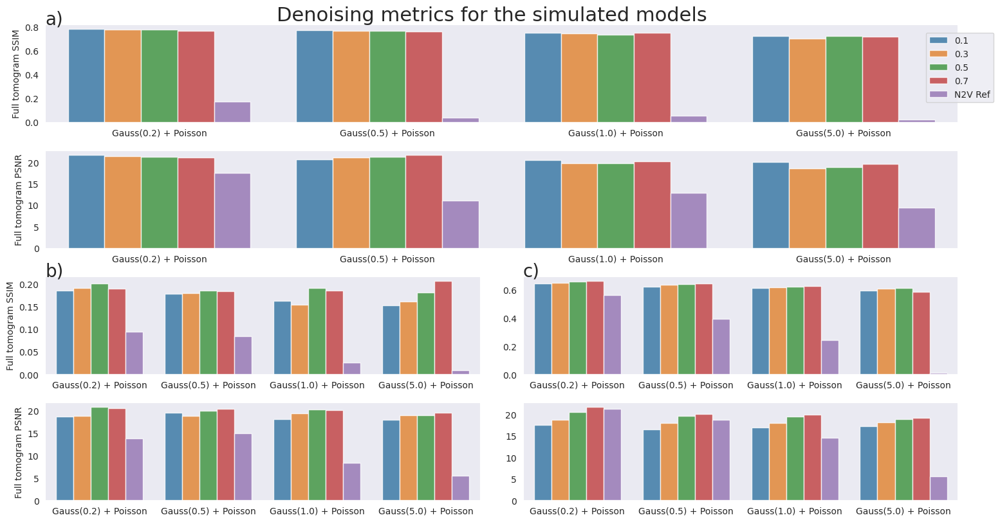

In [92]:
plt.figure(figsize=(15, 8), dpi=100)
grid = plt.GridSpec(4, 2)

ax0 = plt.subplot(grid[0, :])
ax1 = plt.subplot(grid[1, :])
ax2 = plt.subplot(grid[2, 0])
ax3 = plt.subplot(grid[3, 0])
ax4 = plt.subplot(grid[2, 1])
ax5 = plt.subplot(grid[3, 1])

plt.tight_layout()
plt.suptitle('Denoising metrics for the tomoPhantom images', y=1.01, size=22)

axs = [[ax0, ax1], [ax2, ax3], [ax4, ax5]]
ns = ['cell', 'blobs', 'spaceship']

i = 0
for n, ax in zip(ns, axs):
    print(n)
    aux = df[df.tomo_name==n]
    name = aux.tomo_name.values[0]

    sns.barplot(data=aux, hue='p', y='full_tomo_ssim', x='noise_level', ax=ax[0], alpha=0.8)
    ax[0].set_xlabel('')
    ax[0].set_ylabel('Full tomogram SSIM', fontsize=10)
    ax[0].legend(bbox_to_anchor=(0.96, 0.96))
    ax[0].text(0, 1, string.ascii_lowercase[i]+')', transform=ax[0].transAxes, size=20)

    
    sns.barplot(data=aux, hue='p', y='full_tomo_psnr', x='noise_level', ax=ax[1], alpha=0.8)
    ax[1].set_xlabel('')
    ax[1].set_ylabel('Full tomogram PSNR', fontsize=10)
    ax[1].get_legend().remove()
    i+=1
    

ax2.set_xlabel('')
ax2.get_legend().remove()
ax2.set_ylabel('Full tomogram SSIM', fontsize=10)

ax3.set_xlabel('')
ax3.set_ylabel('Full tomogram PSNR', fontsize=10)

ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.get_legend().remove()

ax5.set_xlabel('')
ax5.set_ylabel('')



# Metrics table from fourierTripleMask experiments

In [3]:
tomo_list = [
    'tomoPhantom_model8_noisyGaussPoissVL',
    'tomoPhantom_model8_noisyGaussPoissL',
    'tomoPhantom_model8_noisyGaussPoissM',
    'tomoPhantom_model8_noisyGaussPoissH',
    'tomoPhantom_model14_noisyGaussPoissVL',
    'tomoPhantom_model14_noisyGaussPoissL',
    'tomoPhantom_model14_noisyGaussPoissM',
    'tomoPhantom_model14_noisyGaussPoissH',
    'tomoPhantom_model16_noisyGaussPoissVL',
    'tomoPhantom_model16_noisyGaussPoissL',
    'tomoPhantom_model16_noisyGaussPoissM',
    'tomoPhantom_model16_noisyGaussPoissH'
            ]

data_log = []

for tomo in tqdm(tomo_list):
    logdir = 'data/S2SDenoising/model_logs/%s/fourierTripleMask_comparison/' %tomo
    logdir = os.path.join(PARENT_PATH, logdir)

    _data_log = logdir_to_dataframe(logdir, clip_values=True)
    data_log.append(_data_log)

data_log = pd.concat(data_log)
data_log = data_log.reset_index().drop('index', 1)
data_log.head()

100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.09s/it]


,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,fourierTripleMask_comparison,version_0,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.7",{'p': '0.5'},14.713,0.134,7.551,0.036,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.7,17.398,0.119,7.551,0.036,275.022,231.562,94.842,130.399,Gauss(0.2) + Poisson,blobs,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.8",{'p': '0.5'},14.408,0.139,7.551,0.036,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.8,17.398,0.119,7.551,0.036,288.548,231.562,90.803,130.399,Gauss(0.2) + Poisson,blobs,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
2,fourierTripleMask_comparison,version_2,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.3",{'p': '0.5'},12.586,0.111,7.551,0.036,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.3,17.398,0.119,7.551,0.036,210.560,231.562,66.678,130.399,Gauss(0.2) + Poisson,blobs,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
3,fourierTripleMask_comparison,version_3,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.5",{'p': '0.5'},13.661,0.124,7.551,0.036,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.5,17.398,0.119,7.551,0.036,247.350,231.562,80.919,130.399,Gauss(0.2) + Poisson,blobs,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
4,fourierTripleMask_comparison,version_0,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.7",{'p': '0.5'},11.502,0.091,6.710,0.025,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.7,14.857,0.084,6.710,0.025,262.849,233.595,71.420,121.418,Gauss(0.5) + Poisson,blobs,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


In [4]:
df = data_log.groupby(['tomo_name', 'noise_level', 'p'])['full_tomo_ssim', 'full_tomo_psnr'].mean().reset_index()

df2 = data_log.groupby(['tomo_name', 'noise_level'])['n2v_ssim', 'n2v_psnr'].mean().reset_index()
df2['p'] = 'N2V Ref'
df2 = df2[['tomo_name', 'noise_level', 'p', 'n2v_ssim', 'n2v_psnr']]
df2.columns = ['tomo_name', 'noise_level', 'p', 'full_tomo_ssim', 'full_tomo_psnr']

df = pd.concat([df, df2])
df.head()

,tomo_name,noise_level,p,full_tomo_ssim,full_tomo_psnr
0,blobs,Gauss(0.2) + Poisson,0.3,0.111,12.586
1,blobs,Gauss(0.2) + Poisson,0.5,0.124,13.661
2,blobs,Gauss(0.2) + Poisson,0.7,0.134,14.713
3,blobs,Gauss(0.2) + Poisson,0.8,0.139,14.408
4,blobs,Gauss(0.5) + Poisson,0.3,0.077,10.776


cell
blobs
spaceship


Text(775.3131313131312, 0.5, '')

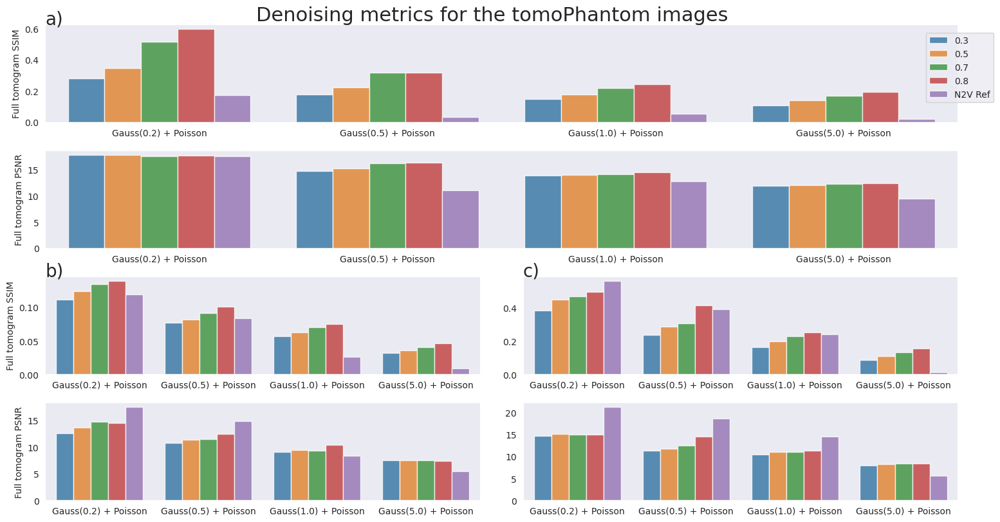

In [5]:
plt.figure(figsize=(15, 8), dpi=100)
grid = plt.GridSpec(4, 2)

ax0 = plt.subplot(grid[0, :])
ax1 = plt.subplot(grid[1, :])
ax2 = plt.subplot(grid[2, 0])
ax3 = plt.subplot(grid[3, 0])
ax4 = plt.subplot(grid[2, 1])
ax5 = plt.subplot(grid[3, 1])

plt.tight_layout()
plt.suptitle('Denoising metrics for the tomoPhantom images', y=1.01, size=22)

axs = [[ax0, ax1], [ax2, ax3], [ax4, ax5]]
ns = ['cell', 'blobs', 'spaceship']

i = 0
for n, ax in zip(ns, axs):
    print(n)
    aux = df[df.tomo_name==n]
    name = aux.tomo_name.values[0]

    sns.barplot(data=aux, hue='p', y='full_tomo_ssim', x='noise_level', ax=ax[0], alpha=0.8)
    ax[0].set_xlabel('')
    ax[0].set_ylabel('Full tomogram SSIM', fontsize=10)
    ax[0].legend(bbox_to_anchor=(0.96, 0.96))
    ax[0].text(0, 1, string.ascii_lowercase[i]+')', transform=ax[0].transAxes, size=20)

    
    sns.barplot(data=aux, hue='p', y='full_tomo_psnr', x='noise_level', ax=ax[1], alpha=0.8)
    ax[1].set_xlabel('')
    ax[1].set_ylabel('Full tomogram PSNR', fontsize=10)
    ax[1].get_legend().remove()
    i+=1
    

ax2.set_xlabel('')
ax2.get_legend().remove()
ax2.set_ylabel('Full tomogram SSIM', fontsize=10)

ax3.set_xlabel('')
ax3.set_ylabel('Full tomogram PSNR', fontsize=10)

ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.get_legend().remove()

ax5.set_xlabel('')
ax5.set_ylabel('')



# Central slice denoising comparison

## Tomophantom models

In [12]:
model_no = 14

tomo_list = [
    'tomoPhantom_model%i_noisyGaussPoissVL' %model_no,
    'tomoPhantom_model%i_noisyGaussPoissL' %model_no,
    'tomoPhantom_model%i_noisyGaussPoissM' %model_no,
    'tomoPhantom_model%i_noisyGaussPoissH' %model_no
]
exp_names = ["realBernoulli_dropoutLevel_comparison", "fourierTripleMask_comparison"]

data_log = []

for exp_name in exp_names:
    for tomo in tomo_list:

        logdir = 'data/S2SDenoising/model_logs/%s/%s/' %(tomo, exp_name)
        logdir = os.path.join(PARENT_PATH, logdir)

        _data_log = logdir_to_dataframe(logdir, clip_values=True)
        data_log.append(_data_log)

data_log = pd.concat(data_log)
data_log = data_log.reset_index().drop('index', 1)
data_log.head()

,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},21.650,0.782,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,11.976,0.052,"1,405.917",NaN,80.778,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,realBernoulli_dropoutLevel_comparison,version_1,singleCET_dataset,0,Bernoulli,{'p': '0.5'},21.286,0.772,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.3,None,None,11.976,0.052,"1,387.612",NaN,77.740,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
2,realBernoulli_dropoutLevel_comparison,version_2,singleCET_dataset,0,Bernoulli,{'p': '0.5'},21.152,0.775,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.5,None,None,11.976,0.052,"1,392.746",NaN,76.626,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
3,realBernoulli_dropoutLevel_comparison,version_3,singleCET_dataset,0,Bernoulli,{'p': '0.5'},21.045,0.766,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.7,None,None,11.976,0.052,"1,375.844",NaN,75.728,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
4,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},20.547,0.769,11.085,0.041,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,11.085,0.041,"1,792.908",NaN,85.360,NaN,Gauss(0.5) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


,index,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,0,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},21.650,0.782,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,11.976,0.052,"1,405.917",NaN,80.778,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,4,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},20.547,0.769,11.085,0.041,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,11.085,0.041,"1,792.908",NaN,85.360,NaN,Gauss(0.5) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
2,8,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},20.517,0.750,10.609,0.034,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,10.609,0.034,"2,078.369",NaN,93.388,NaN,Gauss(1.0) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
3,12,realBernoulli_dropoutLevel_comparison,version_0,singleCET_dataset,0,Bernoulli,{'p': '0.5'},20.061,0.722,9.976,0.026,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.1,None,None,9.976,0.026,"2,629.938",NaN,101.080,NaN,Gauss(5.0) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
4,17,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.8",{'p': '0.5'},17.702,0.600,11.976,0.052,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.8,None,None,11.976,0.052,"1,055.012",NaN,47.811,NaN,Gauss(0.2) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
5,21,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.8",{'p': '0.5'},16.328,0.317,11.085,0.041,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.8,None,None,11.085,0.041,679.808,NaN,47.297,NaN,Gauss(0.5) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
6,25,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.8",{'p': '0.5'},14.522,0.244,10.609,0.034,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.8,None,None,10.609,0.034,608.834,NaN,36.886,NaN,Gauss(1.0) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
7,29,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.8",{'p': '0.5'},12.359,0.192,9.976,0.026,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,None,None,false,0.8,None,None,9.976,0.026,625.191,NaN,23.882,NaN,Gauss(5.0) + Poisson,cell,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


Text(0.93, 0.4, 'Fourier')

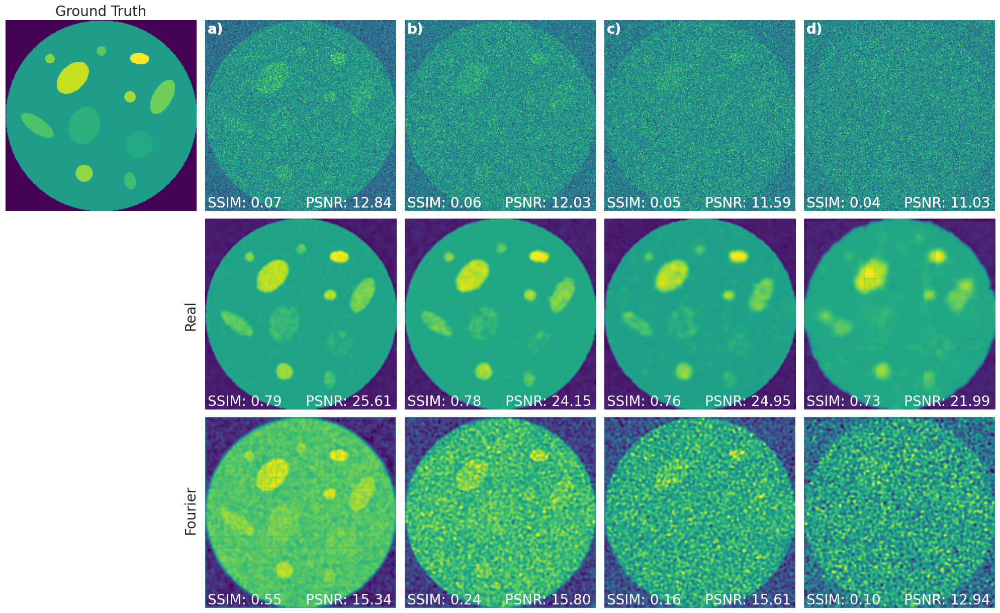

In [14]:
cond1 = (data_log.model=='realBernoulli_dropoutLevel_comparison') & (data_log.version=='version_0')
cond2 = (data_log.model=='fourierTripleMask_comparison') & (data_log.version=='version_1') # Model 14, almost all versions have best scores with more dropout

aux_df = data_log[cond1 | cond2]

idx = aux_df.groupby(['model', 'noise_level'])['full_tomo_ssim'].transform(max) == aux_df['full_tomo_ssim']

df = aux_df[idx].reset_index()

display(df)

fig, ax = plt.subplots(3, 5, figsize=(20, 12), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for i, row in df.iterrows():
    gt = read_array(row.gt_tomo_path)
    gt = standardize(clip(gt))
    gt = scale(gt)
    noisy = read_array(row.tomo_path)
    noisy = standardize(clip(noisy))
    noisy = scale(noisy)
    denoised = read_array(row.pred_path)
    denoised = standardize(clip(denoised))
    denoised = scale(denoised)
    
    zidx = len(gt)//2
    
    # print(row.pred_path, '\n')
    
    ax[0][0].imshow(gt[zidx], vmin=0, vmax=1)
    ax[0][0].set_title('Ground Truth', size=20)
    
    i = i%4
    
    ax_noisy = ax[0][i+1]
    if row.model=='fourierTripleMask_comparison':
        ax_denoised = ax[2][i+1]
    else:
        ax_denoised = ax[1][i+1]
        
    ax_noisy.imshow(noisy[zidx], vmin=0, vmax=1)
    ax_denoised.imshow(denoised[zidx], vmin=0, vmax=1)
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_noisy.transAxes, size=20, color='white')
    ax_noisy.text(0.5+0.025, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_noisy.transAxes, size=20, color='white')

    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=ax_noisy.transAxes, size=20, weight='bold', color='white')
    ax_denoised.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_denoised.transAxes, size=20, color='white')
    ax_denoised.text(0.5+2*0.0125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_denoised.transAxes, size=20, color='white')
    
ax[1][0].text(0.93,0.43, "Real", rotation='vertical', size=20)
ax[2][0].text(0.93,0.4, "Fourier", rotation='vertical', size=20)

In [21]:
(80-53)/80, (27.69-16.47)/27.69

(0.3375, 0.4052004333694475)

## Real tomograms (dummy)

In [2]:
tomo_list = ["tomo04_dummy"]
exp_names = ["realBernoulli_volMask_comparison", "fourierTripleMask_comparison"]

data_log = []

for exp_name in exp_names:
    for tomo in tomo_list:

        logdir = 'data/S2SDenoising/model_logs/%s/%s/' %(tomo, exp_name)
        logdir = os.path.join(PARENT_PATH, logdir)

        _data_log = logdir_to_dataframe(logdir, clip_values=True)
        data_log.append(_data_log)

data_log = pd.concat(data_log)
data_log = data_log.reset_index().drop('index', 1)
data_log.head()

,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,realBernoulli_volMask_comparison,version_0,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob=1",{'p': '0.5'},17.208,0.380,13.637,0.272,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.5,None,None,18.426,0.524,-27.557,NaN,-6.606,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,realBernoulli_volMask_comparison,version_1,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob...",{'p': '0.5'},18.394,0.478,17.976,0.524,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,true,0.5,None,None,18.426,0.524,-8.915,NaN,-0.172,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
2,realBernoulli_volMask_comparison,version_2,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob...",{'p': '0.5'},16.540,0.337,13.637,0.272,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.5,None,None,18.426,0.524,-35.718,NaN,-10.236,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
3,realBernoulli_volMask_comparison,version_3,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob...",{'p': '0.5'},18.402,0.516,17.976,0.524,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,true,0.5,None,None,18.426,0.524,-1.656,NaN,-0.128,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
4,realBernoulli_volMask_comparison,version_4,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob=0",{'p': '0.5'},16.637,0.345,13.637,0.272,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.5,None,None,18.426,0.524,-34.135,NaN,-9.705,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


,index,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,0,realBernoulli_volMask_comparison,version_0,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob=1",{'p': '0.5'},17.208,0.380,13.637,0.272,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.5,None,None,17.976,0.524,-27.557,NaN,-4.273,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,6,fourierTripleMask_comparison,version_0,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.7",{'p': '0.5'},18.108,0.523,13.637,0.272,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,false,0.7,None,None,16.287,0.365,43.012,NaN,11.177,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


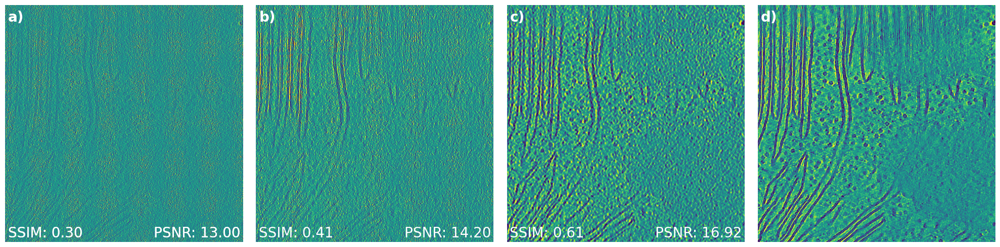

In [7]:
# cond1 = (data_log.model=='realBernoulli_dropoutLevel_comparison') & (data_log.version=='version_0')
# cond2 = (data_log.model=='fourierTripleMask_comparison') & (data_log.version=='version_1') # almost all versions have best scores with more dropout

aux_df = data_log[data_log.use_deconv_data=='false']

idx = aux_df.groupby(['model'])['full_tomo_ssim'].transform(max) == aux_df['full_tomo_ssim']

df = aux_df[idx].reset_index()

display(df)

fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for i in range(len(ax)):
    ax[i].text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=ax[i].transAxes, size=20, weight='bold', color='white')

for i, row in df.iterrows():
    gt = read_array(row.gt_tomo_path)
    gt = standardize(clip(gt))
    gt = scale(gt)
    # gt = exposure.equalize_hist(gt)
    
    noisy = read_array(row.tomo_path)
    noisy = standardize(clip(noisy))
    noisy = scale(noisy)
    # noisy = exposure.equalize_hist(noisy)
    
    denoised = read_array(row.pred_path)
    denoised = standardize(clip(denoised))
    denoised = scale(denoised)
    # denoised = exposure.equalize_hist(denoised)
    
    zidx = len(gt)//2
    
    # print(row.pred_path, '\n')
    
    ax_noisy = ax[0]
    ax_noisy.imshow(noisy[zidx], vmin=0, vmax=1)
    # ax_noisy.set_title('Input', size=20)

    if row.model=='fourierTripleMask_comparison':
        ax_denoised = ax[2]
        title = 'Fourier'
    else:
        ax_denoised = ax[1]
        title = "Real"
        
    ax[3].imshow(gt[zidx], vmin=0, vmax=1)
    # ax[3].set_title('Cryo-CARE', size=20)
    
    ax_denoised.imshow(denoised[zidx], vmin=0, vmax=1)
    # ax_denoised.set_title(title, size=20)
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_noisy.transAxes, size=20, color='white')
    ax_noisy.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_noisy.transAxes, size=20, color='white')
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_denoised.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_denoised.transAxes, size=20, color='white')
    ax_denoised.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_denoised.transAxes, size=20, color='white')

In [4]:
def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # # Display image
    # ax_img.imshow(image, cmap=plt.cm.gray)
    # ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

(<AxesSubplot:>, <AxesSubplot:xlabel='Pixel intensity'>, <AxesSubplot:>)

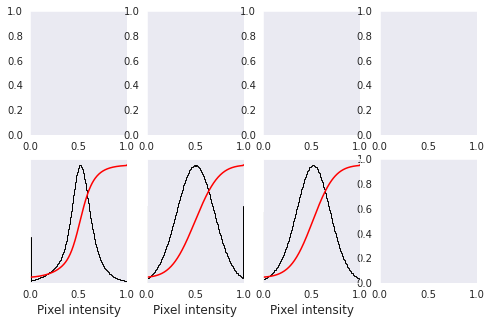

In [5]:
# Display results
fig = plt.figure(figsize=(8, 5))
axes = np.zeros((2, 4), dtype=np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
    
plot_img_and_hist(gt, axes[:, 0])
plot_img_and_hist(noisy, axes[:, 1])
plot_img_and_hist(denoised, axes[:, 2])

,index,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,6,realBernoulli_volMask_comparison,version_6,singleCET_dataset,0,"VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob...",{'p': '0.5'},19.644,0.498,18.426,0.382,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,true,0.5,None,None,18.426,0.524,-5.019,NaN,6.614,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...
1,8,fourierTripleMask_comparison,version_1,singleCET_FourierDataset,0,"p0.1, Vmask_p0.5, volFact8, dropout0.7, deconv",{'p': '0.5'},18.897,0.450,16.287,0.365,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,/home/ubuntu/Thesis/data/S2SDenoising/dummy_to...,null,null,true,0.7,None,None,16.287,0.365,23.237,NaN,16.019,NaN,None,tomo04_dummy,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


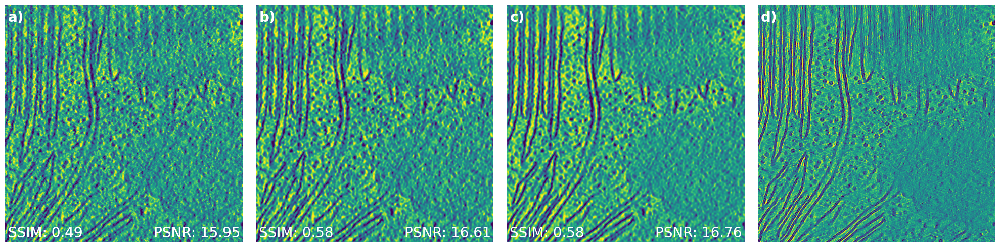

In [5]:
cond1 = (data_log.model=='realBernoulli_volMask_comparison') & (data_log.version=='version_6') # version_6 uses the newest deconv params
cond2 = (data_log.model=='fourierTripleMask_comparison') & (data_log.version=='version_1') # almost all versions have best scores with more dropout
aux_df = data_log[cond1 | cond2]

# aux_df = data_log[data_log.use_deconv_data=='true']

idx = aux_df.groupby(['model'])['full_tomo_ssim'].transform(max) == aux_df['full_tomo_ssim']

df = aux_df[idx].reset_index()

display(df)

fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for i in range(len(ax)):
    ax[i].text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=ax[i].transAxes, size=20, weight='bold', color='white')

for i, row in df.iterrows():
    gt = read_array(row.gt_tomo_path)
    gt = standardize(clip(gt))
    gt = scale(gt)
    
    noisy = read_array(row.tomo_path)
    deconv_kwargs0 = {"vol": noisy, **deconv_kwargs}
    noisy = tom_deconv_tomo(**deconv_kwargs0)
    
    noisy = standardize(clip(noisy))
    noisy = scale(noisy)
    
    denoised = read_array(row.pred_path)
    denoised = standardize(clip(denoised))
    denoised = scale(denoised)
    
    zidx = len(gt)//2
    
    # print(row.pred_path, '\n')
    
    ax_noisy = ax[0]
    ax_noisy.imshow(noisy[zidx], vmin=0, vmax=1)
    # ax_noisy.set_title('Input', size=20)

    if row.model=='fourierTripleMask_comparison':
        ax_denoised = ax[2]
        title = 'Fourier'
    else:
        ax_denoised = ax[1]
        title = "Real"
        
    ax[3].imshow(gt[zidx], vmin=0, vmax=1)
    # ax[3].set_title('Cryo-CARE', size=20)
    
    ax_denoised.imshow(denoised[zidx], vmin=0, vmax=1)
    # ax_denoised.set_title(title, size=20)
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_noisy.transAxes, size=20, color='white')
    ax_noisy.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_noisy.transAxes, size=20, color='white')
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_denoised.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_denoised.transAxes, size=20, color='white')
    ax_denoised.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_denoised.transAxes, size=20, color='white')

In [4]:
df.Version_comment.values

array(['VolMask(0.5), p=0.5, dropout_p=0.5, Vmask_prob=0, deconv',
       'p0.1, Vmask_p0.5, volFact8, dropout0.7, deconv'], dtype=object)

(<AxesSubplot:>, <AxesSubplot:xlabel='Pixel intensity'>, <AxesSubplot:>)

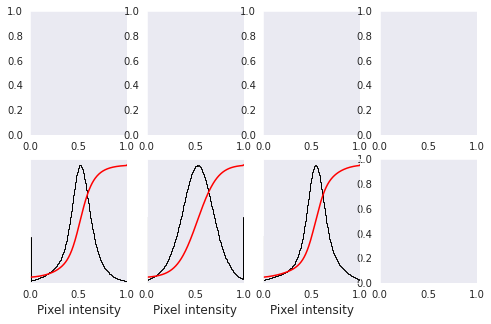

In [9]:
# Display results
fig = plt.figure(figsize=(8, 5))
axes = np.zeros((2, 4), dtype=np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
    
plot_img_and_hist(gt, axes[:, 0])
plot_img_and_hist(noisy, axes[:, 1])
plot_img_and_hist(denoised, axes[:, 2])

## Real tomograms

In [4]:
tomo_list = ["tomo02"]
exp_names = ["raw_denoising"]

data_log = []

for exp_name in exp_names:
    for tomo in tomo_list:

        logdir = 'data/S2SDenoising/model_logs/%s/%s/' %(tomo, exp_name)
        logdir = os.path.join(PARENT_PATH, logdir)

        _data_log = logdir_to_dataframe(logdir, clip_values=True)
        data_log.append(_data_log)

data_log = pd.concat(data_log)
data_log = data_log.reset_index().drop('index', 1)
data_log.head()

,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,raw_denoising,version_0,singleCET_FourierDataset,0,Fourier dropout: 0.8,{'p': '0.5'},NaN,NaN,NaN,NaN,/home/ubuntu/Thesis/data/raw_cryo-ET/tomo02.mrc,/home/ubuntu/Thesis/data/nnUnet/nifti_files/to...,None,None,false,0.8,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,tomo02,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


In [6]:
data_log['full_tomo_ssim'] = 0

,index,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,0,raw_denoising,version_0,singleCET_FourierDataset,0,Fourier dropout: 0.8,{'p': '0.5'},NaN,0,NaN,NaN,/home/ubuntu/Thesis/data/raw_cryo-ET/tomo02.mrc,/home/ubuntu/Thesis/data/nnUnet/nifti_files/to...,None,None,false,0.8,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,tomo02,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


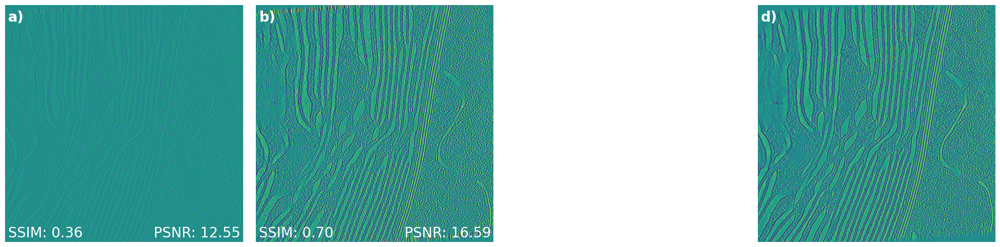

In [ ]:
# cond1 = (data_log.model=='realBernoulli_dropoutLevel_comparison') & (data_log.version=='version_0')
# cond2 = (data_log.model=='fourierTripleMask_comparison') & (data_log.version=='version_1') # almost all versions have best scores with more dropout

aux_df = data_log[data_log.use_deconv_data=='false']

idx = aux_df.groupby(['model'])['full_tomo_ssim'].transform(max) == aux_df['full_tomo_ssim']

df = aux_df[idx].reset_index()

display(df)

fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for i in range(len(ax)):
    ax[i].text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=ax[i].transAxes, size=20, weight='bold', color='white')

for i, row in df.iterrows():
    gt = read_array(row.gt_tomo_path)
    gt = standardize(clip(gt))
    gt = scale(gt)
    # gt = exposure.equalize_hist(gt)
    
    noisy = read_array(row.tomo_path)
    noisy = standardize(clip(noisy))
    noisy = scale(noisy)
    # noisy = exposure.equalize_hist(noisy)
    
    denoised = read_array(row.pred_path)
    denoised = standardize(clip(denoised))
    denoised = scale(denoised)
    # denoised = exposure.equalize_hist(denoised)
    
    zidx = len(gt)//2
    
    # print(row.pred_path, '\n')
    
    ax_noisy = ax[0]
    ax_noisy.imshow(noisy[zidx], vmin=0, vmax=1)
    # ax_noisy.set_title('Input', size=20)

    if row.model=='fourierTripleMask_comparison':
        ax_denoised = ax[2]
        title = 'Fourier'
    else:
        ax_denoised = ax[1]
        title = "Real"
        
    ax[3].imshow(gt[zidx], vmin=0, vmax=1)
    # ax[3].set_title('Cryo-CARE', size=20)
    
    ax_denoised.imshow(denoised[zidx], vmin=0, vmax=1)
    # ax_denoised.set_title(title, size=20)
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_noisy.transAxes, size=20, color='white')
    ax_noisy.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_noisy.transAxes, size=20, color='white')
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_denoised.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_denoised.transAxes, size=20, color='white')
    ax_denoised.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_denoised.transAxes, size=20, color='white')

,index,model,version,dataset,TV_alpha,Version_comment,transform,full_tomo_psnr,full_tomo_ssim,baseline_psnr,baseline_ssim,tomo_path,gt_tomo_path,use_deconv_as_target,predict_simRecon,use_deconv_data,p,n2v_psnr,n2v_ssim,baseline_psnr_best,baseline_ssim_best,ssim_vs_baseline,n2v_ssim_vs_baseline,psnr_vs_baseline,n2v_psnr_vs_baseline,noise_level,tomo_name,pred_path
0,0,raw_denoising,version_0,singleCET_FourierDataset,0,Fourier dropout: 0.8,{'p': '0.5'},NaN,0,NaN,NaN,/home/ubuntu/Thesis/data/raw_cryo-ET/tomo02.mrc,/home/ubuntu/Thesis/data/nnUnet/nifti_files/to...,None,None,false,0.8,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,tomo02,/home/ubuntu/Thesis/data/S2SDenoising/model_lo...


Original Tomogram shape: (464, 928, 928)
Output Tomogram shape: (232, 464, 464)


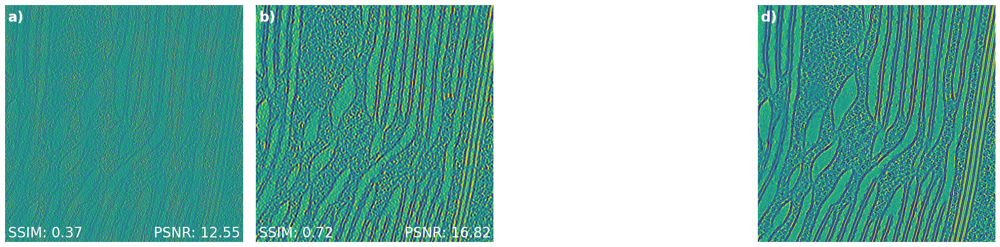

In [8]:
# cond1 = (data_log.model=='realBernoulli_dropoutLevel_comparison') & (data_log.version=='version_0')
# cond2 = (data_log.model=='fourierTripleMask_comparison') & (data_log.version=='version_1') # almost all versions have best scores with more dropout

aux_df = data_log[data_log.use_deconv_data=='false']

idx = aux_df.groupby(['model'])['full_tomo_ssim'].transform(max) == aux_df['full_tomo_ssim']

df = aux_df[idx].reset_index()

display(df)

fig, ax = plt.subplots(1, 4, figsize=(20, 5), dpi=100)
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for i in range(len(ax)):
    ax[i].text(0.0125, 0.93, string.ascii_lowercase[i]+')', transform=ax[i].transAxes, size=20, weight='bold', color='white')

for i, row in df.iterrows():
    gt = read_array(row.gt_tomo_path)

    print('Original Tomogram shape:', gt.shape)

    z,y,x = gt.shape

    gt = gt[z//4:3*z//4, y//4:3*y//4, x//4:3*x//4]
    print('Output Tomogram shape:', gt.shape)
    
    gt = standardize(clip(gt))
    gt = scale(gt)
    # gt = exposure.equalize_hist(gt)
    
    noisy = read_array(row.tomo_path)[z//4:3*z//4, y//4:3*y//4, x//4:3*x//4]
    noisy = standardize(clip(noisy))
    noisy = scale(noisy)
    # noisy = exposure.equalize_hist(noisy)
    
    denoised = read_array(row.pred_path)[z//4:3*z//4, y//4:3*y//4, x//4:3*x//4]
    denoised = standardize(clip(denoised))
    denoised = scale(denoised)
    # denoised = exposure.equalize_hist(denoised)
    
    zidx = len(gt)//2
    
    # print(row.pred_path, '\n')
    
    ax_noisy = ax[0]
    ax_noisy.imshow(noisy[zidx], vmin=0, vmax=1)
    # ax_noisy.set_title('Input', size=20)

    if row.model=='fourierTripleMask_comparison':
        ax_denoised = ax[2]
        title = 'Fourier'
    else:
        ax_denoised = ax[1]
        title = "Real"
        
    ax[3].imshow(gt[zidx], vmin=0, vmax=1)
    # ax[3].set_title('Cryo-CARE', size=20)
    
    ax_denoised.imshow(denoised[zidx], vmin=0, vmax=1)
    # ax_denoised.set_title(title, size=20)
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(noisy[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_noisy.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_noisy.transAxes, size=20, color='white')
    ax_noisy.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_noisy.transAxes, size=20, color='white')
    
    _ssim = ssim(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    _psnr = peak_signal_noise_ratio(torch.tensor(gt[zidx]).unsqueeze(0).unsqueeze(0),
                 torch.tensor(denoised[zidx]).unsqueeze(0).unsqueeze(0), 
                 data_range=1)
    
    ax_denoised.text(0.0125, 0.02, 'SSIM: %.02f' %float(_ssim), transform=ax_denoised.transAxes, size=20, color='white')
    ax_denoised.text(0.5+0.125, 0.02, 'PSNR: %.02f' %float(_psnr), transform=ax_denoised.transAxes, size=20, color='white')